# Présentation des résultats

Chargement des Packages nécessaires

In [37]:
using CSV
using DataFrames
using DataFramesMeta
using Dates
using StatsPlots
using Statistics
using Temporal
using GLM
using TimeSeries: TimeArray 
using StatsBase
using Forecast
using LinearAlgebra

Données

In [183]:

# Fonction pour lire et filtrer les données
function read_and_filter_data(filepath, date_column::Symbol, value_column::Symbol, header_row::Int, skip_rows::Int)
    df = CSV.read(filepath, DataFrame, header = header_row, skipto = skip_rows, comment = "#", dateformat = "yyyymmdd", types = Dict(date_column => Date), normalizenames = true)
    df_filtered = filter(row -> year(row[date_column]) >= 1955 && year(row[date_column]) <= 2005, df)
    return df_filtered
end

# Lire tous les fichiers dans un dossier et agréger les données
function aggregate_data_from_folder(folder_path::String, date_column::Symbol, value_column::Symbol, header_row::Int, skip_rows::Int)
    files = readdir(folder_path)
    all_data = DataFrame()
    
    for file in files
        filepath = joinpath(folder_path, file)
        df = read_and_filter_data(filepath, date_column, value_column, header_row, skip_rows)
        append!(all_data, df)
    end
    
    # Supprimer les valeurs manquantes
    all_data = filter(row -> row[value_column] != 9, all_data)
    
    # Calculer la moyenne et l'écart type pour chaque date
    
    if value_column == :Tmax
        aggregated_data = @chain all_data begin
            @transform(:YEAR = year.(all_data[!, date_column])) # Ajouter une colonne pour l'année
            @by(date_column, :DAILY_MEAN = mean(:Tmax), :DAILY_STD = std(:Tmax)) # Grouper par date et calculer moyenne / écart type
        end
    else
        aggregated_data = @chain all_data begin
            @subset(:Q_TX .!= 9) # Supprimer les valeurs manquantes 
            @transform(:YEAR = year.(:DATE)) # Ajouter une colonne pour l'année
            @by(date_column, :DAILY_MEAN = mean(:TX), :DAILY_STD = std(:TX)) # Grouper par date et calculer moyenne / écart type
        end
    end

    return aggregated_data
end

# Chemins des dossiers
data_station_folder = "data_station_extract_script/data_tx"
data_drias_folder = "data_drias/Mod1_temp"
data_mod2_folder = "data_drias/Mod2_temp"

# Agréger les données des dossiers
data_station_aggregated = aggregate_data_from_folder(data_station_folder, :DATE, :TX, 21, 22)
data_drias_aggregated = aggregate_data_from_folder(data_drias_folder, :Date, :Tmax, 60, 61)
data_mod2_aggregated = aggregate_data_from_folder(data_mod2_folder, :Date, :Tmax, 59, 60)

# Conversion factor to °C for data_station
factor = 0.1
data_station_aggregated[!, :DAILY_MEAN] .= data_station_aggregated[!, :DAILY_MEAN] * factor
data_station_aggregated[!, :DAILY_STD] .= data_station_aggregated[!, :DAILY_STD] * factor

# Trier les données par date
sort!(data_station_aggregated, :DATE)
sort!(data_drias_aggregated, :Date)
sort!(data_mod2_aggregated, :Date)

df_daily = data_station_aggregated  
df_daily_drias = data_drias_aggregated
df_daily_mod2 = data_mod2_aggregated

# Convertir les données en séries temporelles
my_ts = TimeArray(data_station_aggregated[!, :DATE], data_station_aggregated[!, :DAILY_MEAN])
my_ts_drias = TimeArray(data_drias_aggregated[!, :Date], data_drias_aggregated[!, :DAILY_MEAN])
my_ts_mod2 = TimeArray(data_mod2_aggregated[!, :Date], data_mod2_aggregated[!, :DAILY_MEAN])

# Extraire les valeurs numériques de la série temporelle
data_values = values(my_ts)
data_values_drias = values(my_ts_drias)
data_values_mod2 = values(my_ts_mod2)


18628-element Vector{Float64}:
  7.0520000000000005
  7.844
 11.021333333333333
  8.73
  8.5
  8.681333333333333
  9.596000000000002
 10.592666666666668
 11.183333333333332
 10.991999999999999
  ⋮
 10.541333333333334
 11.546666666666669
 10.711333333333334
  9.318666666666667
  4.968666666666667
  4.450666666666666
  6.736
  6.284666666666667
  5.757333333333334

## Premières Analyses

### Autocorrélogrammes

AUTOCORRÉLOGRAMME PARTIEL


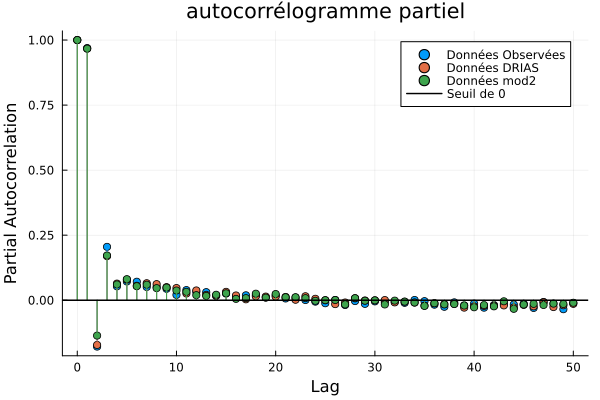

In [43]:
# Calculer l'autocorrélogramme partiel avec un nombre maximal de décalages spécifié
maxlag = 50 # Définir le nombre maximal de décalages
lags = collect(0:maxlag) # Créer une plage de décalages
pacf_values = StatsBase.pacf(data_values, lags)
pacf_values_drias = StatsBase.pacf(data_values_drias, lags)
pacf_values_mod2 = StatsBase.pacf(data_values_mod2, lags)

plot(0:maxlag, pacf_values, label = "Données Observées", xlabel="Lag", ylabel="Partial Autocorrelation", title="autocorrélogramme partiel", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_mod2, label = "Données mod2", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

AUTOCORRÉLOGRAMME EMPIRIQUE

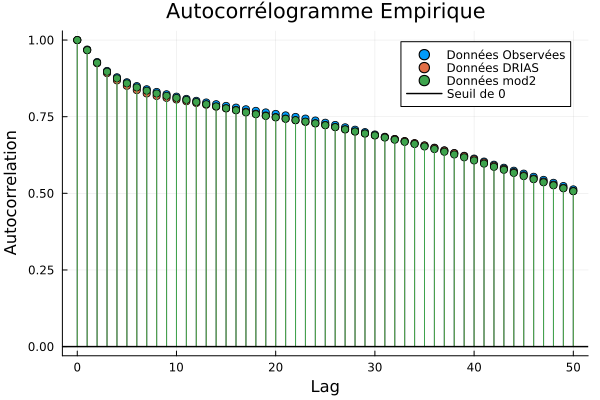

In [44]:
autocor_values = autocor(data_values, lags)
autocor_values_drias = autocor(data_values_drias, lags)
autocor_values_mod2 = autocor(data_values_mod2, lags)

# Tracer l'autocorrélogramme empirique avec les points reliés à l'axe des abscisses et une droite d'équation nulle
plot(0:maxlag, autocor_values, label = "Données Observées", xlabel="Lag", ylabel="Autocorrelation", title="Autocorrélogramme Empirique", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_drias, label = "Données DRIAS", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_mod2, label = "Données mod2", markershape=:circle, line=:stem)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")

### Séries temporelles et tendances

Tracé des deux avec moyennes mobiles classiques

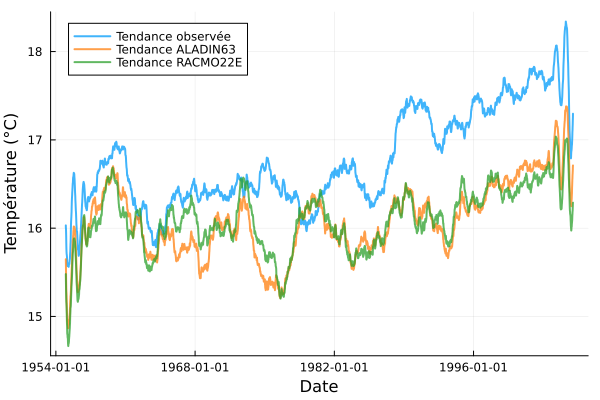

In [186]:
function moyenne_mobile(data::Vector{T}, window_size::Int) where T
    n = length(data)
    trend = similar(data, T)
    for i in 1:n
        start_idx = max(1, i - window_size ÷ 2)
        end_idx = min(n, i + window_size ÷ 2)
        trend[i] = mean(@view(data[start_idx:end_idx]))
    end
    return trend
end

# Calculer la tendance par moyenne mobile avec une fenêtre de taille 730 (deux ans)
trend_values = moyenne_mobile(df_daily.DAILY_MEAN, 1460)
trend_values_drias = moyenne_mobile(df_daily_drias.DAILY_MEAN, 1460)
trend_values_mod2 = moyenne_mobile(df_daily_mod2.DAILY_MEAN, 1460)

# Convertir les données en une série temporelle
datats = TimeArray(df_daily.DATE, df_daily.DAILY_MEAN)
datats_drias = TimeArray(df_daily_drias.Date, df_daily_drias.DAILY_MEAN)
datats_mod2 = TimeArray(df_daily_mod2.Date, df_daily_mod2.DAILY_MEAN)

# Tracer la série temporelle avec la tendance
#plot(datats,  alpha=:0.5,label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)")
#plot(datats_drias, color=:darkorange,  palette =:tab10, alpha=:0.5, label="Série temporelle ALADIN63", xlabel="Date", ylabel="Température (°C)")
#plot(datats_mod2,  color=:green, palette =:tab10, alpha=:0.5, label="Série temporelle RACMO22E", xlabel="Date", ylabel="Température (°C)")
plot(df_daily.DATE, alpha=:0.75, trend_values, label="Tendance observée", linewidth=2, xlabel="Date", ylabel="Température (°C)")
plot!(df_daily_drias.Date,  palette =:tab10, alpha=:0.75, trend_values_drias, label="Tendance ALADIN63", linewidth=2)
plot!(df_daily_mod2.Date, palette =:tab10, alpha=:0.75, trend_values_mod2, label="Tendance RACMO22E", linewidth=2)
#savefig("Tendances_moyenne-mobile.pdf")


Tracé des deux avec moyennes mobiles gaussien


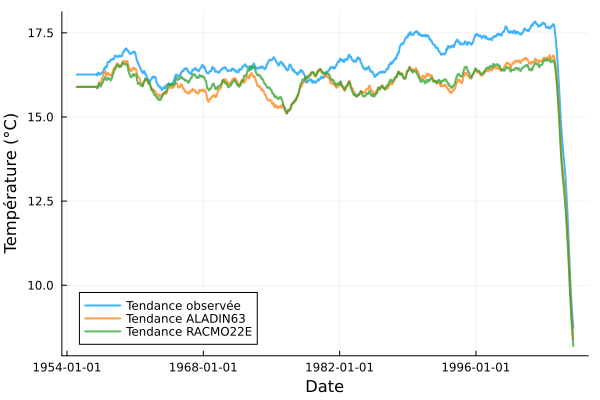

In [189]:

function moyenne_gauss(data::Vector{T}, window_size::Int) where T
    n = length(data)
    trend = similar(data, T)
    for i in 1:n
        weights = exp.(-(collect(1:window_size) .- (window_size ÷ 2)).^2 / (2 * (window_size / 2)^2))
        weights /= sum(weights)  # Normalisation des poids pour que leur somme soit égale à 1
        start_idx = max(1, i - window_size ÷ 2)
        end_idx = min(n, start_idx + window_size - 1)  # Ajustement de la fin de la tranche de données
        data_slice = @view(data[start_idx:end_idx])
        trend[i] = sum(data_slice .* weights[1:length(data_slice)])
    end
    return trend
end

# Calculer la tendance par moyenne mobile avec une fenêtre de taille 730 (deux ans)
trend_gauss = moyenne_gauss(df_daily.DAILY_MEAN, 1460)
trend_gauss_drias = moyenne_gauss(df_daily_drias.DAILY_MEAN, 1460)
trend_gauss_mod2 = moyenne_gauss(df_daily_mod2.DAILY_MEAN, 1460)

# Tracer la série temporelle avec la tendance

plot(df_daily.DATE, alpha=:0.75,trend_gauss, label="Tendance observée", linewidth=2, xlabel="Date", ylabel="Température (°C)")
plot!(df_daily_drias.Date, palette =:tab10,alpha=:0.75, trend_gauss_drias, label="Tendance ALADIN63 ", linewidth=2)
plot!(df_daily_mod2.Date, alpha=:0.75, trend_gauss_mod2, label="Tendance RACMO22E", linewidth=2)
#savefig("Tendances_gaussien.pdf")


Décomposition de la série avec le package Forecast

In [190]:
stl_df = stl(df_daily,1460; robust=true, spm=true)
stl_df_drias = stl(df_daily_drias,1460; robust=true, spm=true)
stl_df_mod2 = stl(df_daily_mod2,1460; robust=true, spm=true)
stl_df.decomposition
stl_df_drias.decomposition
stl_df_mod2.decomposition

┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165
┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165
┌ Info: Corvengence achieved (< 0.01); Stopping computation...
└ @ Forecast /Users/mario/.julia/packages/Forecast/Pu4g0/src/stl.jl:165


,Timestamp,Seasonal,Trend,Remainder
,Date,Float64,Float64,Float64
1,1955-01-01,-7.27427,15.2292,-0.902966
2,1955-01-02,-7.31785,15.2298,-0.067986
3,1955-01-03,-7.35895,15.2304,3.14984
4,1955-01-04,-7.39756,15.231,0.896515
5,1955-01-05,-7.4337,15.2316,0.702049
6,1955-01-06,-7.46737,15.2323,0.916448
7,1955-01-07,-7.49858,15.2329,1.86172
8,1955-01-08,-7.52733,15.2335,2.88654
9,1955-01-09,-7.55365,15.2341,3.50292


Tracé des deux avec moyennes mobiles du package Forecast


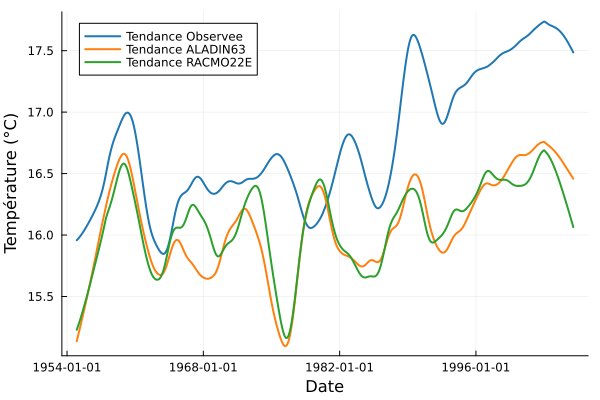

In [191]:
#plot(datats, alpha=:0.5, main = "Tendances", label="Série temporelle observée", xlabel="Date", ylabel="Température (°C)", legend=:topright)
#plot!(datats_drias,palette =:tab10,alpha=:0.5, label="Série temporelle ALADIN63", legend=:topright)
#plot!(datats_mod2,palette =:tab10,alpha=:0.5, label="Série temporelle RACMO22E", legend=:topright)
@df stl_df.decomposition plot(:Timestamp, :Trend, label="Tendance Observee",palette =:tab10, linewidth=2, xlabel="Date", ylabel="Température (°C)")
@df stl_df_drias.decomposition plot!(:Timestamp, :Trend, label="Tendance ALADIN63",palette =:tab10, linewidth=2)
@df stl_df_mod2.decomposition plot!(:Timestamp, :Trend, label="Tendance RACMO22E",palette =:tab10, linewidth=2)
#savefig("Tendances_Forecast.pdf")

Comparaison des différentes méthodes des tendances

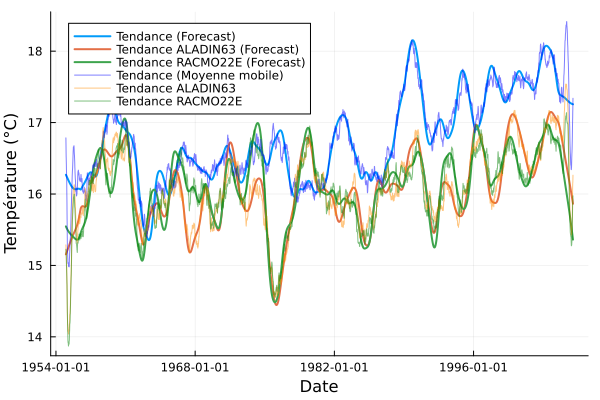

In [170]:
@df stl_df.decomposition plot(:Timestamp, :Trend,  main = "Tendances", label="Tendance (Forecast)",linewidth = 2)
@df stl_df_drias.decomposition plot!(:Timestamp, :Trend, label="Tendance ALADIN63 (Forecast)",linewidth = 2)
@df stl_df_mod2.decomposition plot!(:Timestamp, :Trend, label="Tendance RACMO22E (Forecast)",linewidth = 2)

#plot!(df_daily_drias.Date, color=:darkblue,trend_gauss_drias, label="Tendance DRIAS gaussien", linewidth=2)
#plot!(df_daily.DATE, color=:blue, trend_gauss, label="Tendance (Moyenne gaussien)", linewidth=2)

plot!(df_daily.DATE,color=:blue,  palette =:tab10, alpha=0.5,trend_values, label="Tendance (Moyenne mobile)", xlabel="Date", ylabel="Température (°C)")
plot!(df_daily_drias.Date, color=:darkorange,palette =:tab10, alpha=0.5, trend_values_drias, label="Tendance ALADIN63")
plot!(df_daily_mod2.Date,color=:green, palette =:tab10, alpha=0.5, trend_values_mod2, label="Tendance RACMO22E")
#savefig("Tendances_Forecast_Moyenne-Mobile.pdf")

### SAISONNALITÉ

Calcul à la main d'une saisonnalité

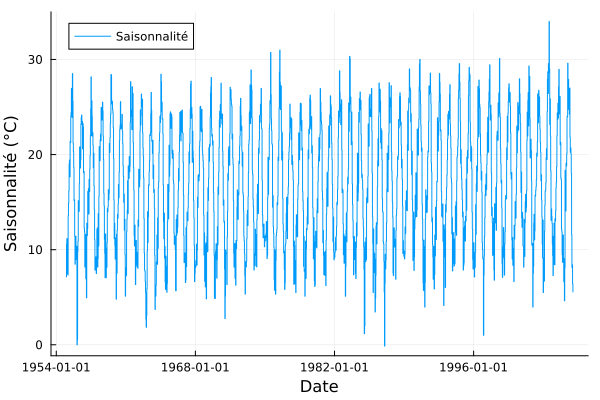

In [132]:

function saisonnalite(data::Vector{T}, period::Int) where T
    n = length(data)
    seasonal = similar(data, T) # Vecteur de la même taille et du meme type que data 
    seasonal_count = Int(ceil(n / period))
    
    seasonal_avg = similar(data, T)
    for i in 1:seasonal_count
        start_idx = (i - 1) * period + 1
        end_idx = min(i * period, n)
        seasonal_avg[start_idx:end_idx] .= mean(@view(data[start_idx:end_idx]))
    end
    
    for i in 1:n
        seasonal[i] = seasonal_avg[i]
    end
    
    return seasonal
end

# Calculer la saisonnalité avec une période saisonnière de 12 mois (par exemple)
seasonal_values = saisonnalite(df_daily.DAILY_MEAN, 12)

# Tracer la série temporelle de la saisonnalité
plot(df_daily.DATE, seasonal_values, label="Saisonnalité", xlabel="Date", ylabel="Saisonnalité (°C)")


Saisonnalité avec Forecast

In [164]:
@df stl_df.decomposition plot(:Timestamp, :Seasonal,  label = "Tendance observée",palette =:tab10, xlabel="Date", ylabel="Température (°C)")
@df stl_df_drias.decomposition plot!(:Timestamp, :Seasonal, label="Tendance ALADIN63",palette =:tab10)
@df stl_df_mod2.decomposition plot!(:Timestamp, :Seasonal, label="Tendance RACMO22E",palette =:tab10)
savefig("Saisonnalité_Forecast.pdf")

"/Users/mario/Changement_climatique/data/Saisonnalité_Forecast.pdf"

### BRUIT

In [163]:

function retiresaisonnalite(data::Vector{T}) where T
    n = length(data)
    saisonnalite = stl_df.decomposition.Seasonal
    tendance = stl_df.decomposition.Trend
    
    for i in 1:n
        data[i] = data[i] - saisonnalite[i] - tendance[i]
    end
    
    return data
end

# Calculer la saisonnalité 
residus = retiresaisonnalite(df_daily.DAILY_MEAN)
residus_drias = retiresaisonnalite(df_daily_drias.DAILY_MEAN)
residus_mod2 = retiresaisonnalite(df_daily_mod2.DAILY_MEAN)


# Tracer la série temporelle de la saisonnalité
plot(df_daily.DATE, residus, label="Résidus observés",palette =:tab10, alpha = 0.75, xlabel="Date", ylabel="Température (°C)")
plot!(df_daily_drias.Date, residus_drias, label="Résidus ALADIN63",palette =:tab10, alpha = 0.75)
plot!(df_daily_mod2.Date, residus_mod2, label="Résidus RACMO22E",palette =:tab10, alpha = 0.75)
#savefig("Résidus_Forecast.pdf")

"/Users/mario/Changement_climatique/data/Résidus_Forecast.pdf"

## Analyse des résidus

### Autocorrélogrammes de la série résiduelle

Autocorrélogramme partiel


In [171]:
# Calculer l'autocorrélogramme partiel avec un nombre maximal de décalages spécifié
maxlag = 50 # Définir le nombre maximal de décalages
lags = collect(0:maxlag) # Créer une plage de décalages
pacf_values_res = StatsBase.pacf(residus, lags)
pacf_values_drias_res = StatsBase.pacf(residus_drias, lags)
pacf_values_mod2_res = StatsBase.pacf(residus_mod2, lags)

plot(0:maxlag, pacf_values_res, label = "Données observées", xlabel="Lag", ylabel=" Autocorrelation Partielle", title="Autocorrélogramme Partiel", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_drias_res, label = "Données ALADIN63", markershape=:circle, line=:stem)
plot!(0:maxlag, pacf_values_mod2_res, label = "Données RACMO22E", markershape=:circle, line=:stem, alpha = 0.75)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")
savefig("Autocorrélogramme_Partiel.pdf")

"/Users/mario/Changement_climatique/data/Autocorrélogramme_Partiel.pdf"

Autocorrélogramme simple


In [174]:
autocor_values = autocor(residus, lags)
autocor_values_drias = autocor(residus_drias, lags)
autocor_values_mod2 = autocor(residus_mod2, lags)

# Tracer l'autocorrélogramme empirique avec les points reliés à l'axe des abscisses et une droite d'équation nulle
plot(0:maxlag, autocor_values, label = "Données Observées", xlabel="Lag", ylabel="Autocorrelation", title="Autocorrélogramme Simple", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_drias, label = "Données ALADIN63", markershape=:circle, line=:stem)
plot!(0:maxlag, autocor_values_mod2, label = "Données ROCMO22E", markershape=:circle, line=:stem, alpha = 0.75)
hline!([0], color=:black, linewidth=1.5, label = "Seuil de 0")
savefig("Autocorrélogramme_Empirique.pdf")

"/Users/mario/Changement_climatique/data/Autocorrélogramme_Empirique.pdf"

Estimation des coefficients de l'AR(2)

In [178]:
# Construire les matrices pour l'ajustement AR(2)
n = length(residus)
X = hcat(residus[2:end-1], residus[1:end-2])
X_drias = hcat(residus_drias[2:end-1], residus_drias[1:end-2])
X_mod2 = hcat(residus_mod2[2:end-1], residus_mod2[1:end-2])
y_target = residus[3:end]
y_target_drias = residus_drias[3:end]
y_target_mod2 = residus_mod2[3:end]

# Estimer les coefficients en utilisant les moindres carrés
coefficients = X \ y_target
coefficients_drias = X_drias \ y_target_drias
coefficients_mod2 = X_mod2 \ y_target_mod2


# Afficher les coefficients estimés
println("Coefficients estimés pour les observations : ", coefficients)
println("Coefficients estimés pour ALADIN63: ", coefficients_drias)
println("Coefficients estimés pour RACMO22E: ", coefficients_mod2)



Coefficients estimés pour les observations : [1.05012614580392, -0.26230760430047956]
Coefficients estimés pour ALADIN63: [1.0612399297175843, -0.23824590259754547]
Coefficients estimés pour RACMO22E: [1.0291633990980347, -0.1991817489219655]


Estimation des coefficients de l'AR(2) avec Forecast


In [181]:
# Ajuster un modèle AR(2) sur les résidus
model = ar(residus, 2)
model_drias = ar(residus_drias, 2)
model_mod2 = ar(residus_mod2, 2)

# Afficher les résultats
println(model)
println(model_drias)
println(model_mod2)


Multivariate Autoregressive Model

    ar(X, order=2, constant=true)

Residuals Summary
┌──────────┬──────────┬───────────┬───────────┬─────────────┬─────────┬─────────┬──────────────┐
│ Variable │      Min │        1Q │    Median │        Mean │      3Q │     Max │    H0 Normal │
├──────────┼──────────┼───────────┼───────────┼─────────────┼─────────┼─────────┼──────────────┤
│       x1 │ -8.98114 │ -0.973722 │ 0.0866003 │ 1.29703e-17 │ 1.06057 │ 5.74223 │ 2.29893e-116 │
└──────────┴──────────┴───────────┴───────────┴─────────────┴─────────┴─────────┴──────────────┘
┌──────────┬─────────────┬──────────┬───────────┬──────────┐
│ Variable │        Mean │ Variance │  Skewness │ Kurtosis │
├──────────┼─────────────┼──────────┼───────────┼──────────┤
│       x1 │ 1.29703e-17 │  2.47071 │ -0.339462 │ 0.474599 │
└──────────┴─────────────┴──────────┴───────────┴──────────┘

Coefficients

Φ0
┌         ┐
│ 0.0     │
└         ┘
Φ1
┌          ┐
│ 1.05 *** │
└          ┘
Φ2
┌            ┐
│ -0.262